# Import Libraries

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoModelForSeq2SeqLM, pipeline
import torch
import plotly.express as px
from functions import generate_wordcloud, sarcasm_to_binary, classify_emotions, visualize_emotions, topic_modeling, extract_keywords_per_sentiment
from tqdm import tqdm
from wordcloud import WordCloud

# Read Data

In [2]:
df = pd.read_csv('youtube_comments_clean.csv')
df.head()

,video_id,author,comment,likes,published_at,reply_to
0,YBJEiWDPyGs,@kecktus2017,sponsor daniel,0,2025-08-11 10:15:37+00:00,NaN
1,YBJEiWDPyGs,@Par_F2980,shut up,0,2025-08-07 12:17:00+00:00,NaN
2,YBJEiWDPyGs,@stirfe887,955 1999 for 5090 but it coast 500 in germany ...,0,2025-07-30 20:19:53+00:00,NaN
3,YBJEiWDPyGs,@razzor707,that was a sick joke ngl,0,2025-07-30 00:18:59+00:00,NaN
4,YBJEiWDPyGs,@CommentSectionOffender,"considering 5070 super might have 18gb vram, t...",1,2025-07-29 09:32:14+00:00,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45040 entries, 0 to 45039
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   video_id      45040 non-null  object
 1   author        44985 non-null  object
 2   comment       44889 non-null  object
 3   likes         45040 non-null  int64 
 4   published_at  45040 non-null  object
 5   reply_to      7401 non-null   object
dtypes: int64(1), object(5)
memory usage: 2.1+ MB


# Pre-processing and Analysis

In [4]:
df['published_at'] = pd.to_datetime(df['published_at'], utc=True)

df['month'] = df['published_at'].dt.month
df['year'] = df['published_at'].dt.year
df['day_of_week'] = df['published_at'].dt.day_name()
df['hour'] = df['published_at'].dt.hour

We'll extract possible features from existing ones, to look for patterns or trends.

## Visualization of Comments over Time

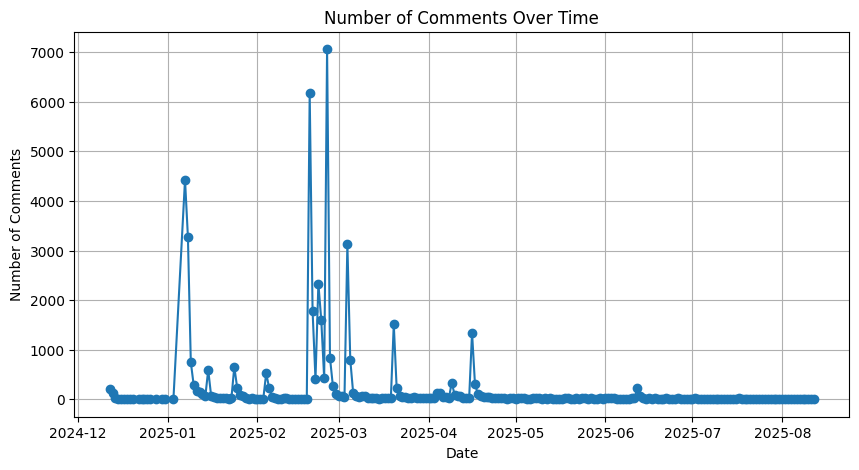

In [5]:
comments_per_day = df.groupby(df['published_at'].dt.date).size()
plt.figure(figsize=(10, 5))
comments_per_day.plot(kind='line', marker='o')
plt.title('Number of Comments Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Comments')
plt.grid(True)
plt.show()

## Top Comments based on Likes

In [6]:
top_comments = df.sort_values(by='likes', ascending=False).head(10)
print("\nTop 10 most liked comments:")
top_comments[['author', 'comment', 'likes']]


Top 10 most liked comments:


,author,comment,likes
9181,@thexgamer8240,"great, now i can finally afford a 980ti.",31773
8138,@CyberBriseno,when he panned to the people in the back that ...,19761
8996,@WackyAapie,bro got abducted to the nvidia backrooms to ma...,16487
30251,@zipzip6677,msrp missing some rops possibly. thanks nvidia.,16287
13387,@The_Jaffo,fake frames! fake msrp! fake product scarcity!...,15726
30319,@JarrodsTech,only february and the 2025 disappointment tour...,10906
26307,@AnoNymous-dh2sv,"the very fact 1,000, is considered midrange, i...",10263
20421,@frankierizzo8516,"but the more you buy, the more you save steve.",8187
28300,@ScytheNoire,evga warned us.,8018
6080,@declanshort2012,still going to wait for a non supervised non s...,7948


## Number of Comments by Day of the Week

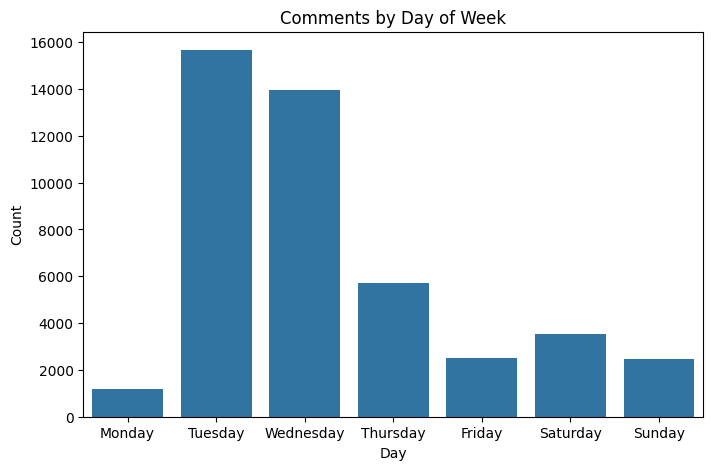

In [7]:
plt.figure(figsize=(8, 5))
sns.countplot(x='day_of_week', data=df, order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.title('Comments by Day of Week')
plt.ylabel('Count')
plt.xlabel('Day')
plt.show()

## Comment Length Distribution

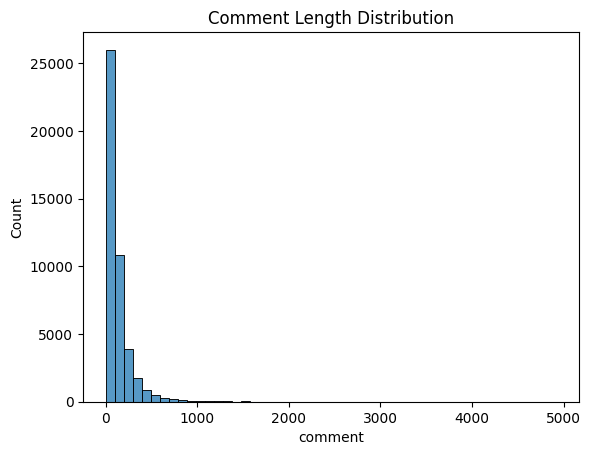

In [8]:
sns.histplot(df['comment'].str.len(), bins=50)
plt.title('Comment Length Distribution')
plt.show()

## Distribution of *Likes*

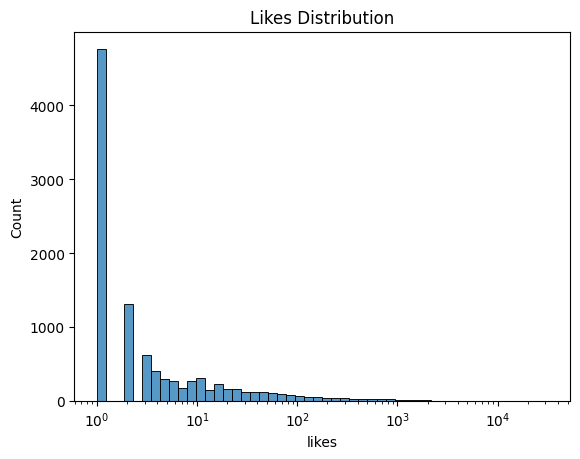

In [9]:
sns.histplot(df['likes'], bins=50, log_scale=True)
plt.title('Likes Distribution')
plt.show()

# Sentiment Analysis

## Using Vader Sentiment Analyzer

In [10]:
#nltk.download('vader_lexicon')

sia = SentimentIntensityAnalyzer()

df['vader_score'] = df['comment'].apply(lambda x: sia.polarity_scores(str(x))['compound'])

# Categorize into labels
def vader_sentiment(score):
    if score >= 0.05:
        return 'positive'
    elif score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

df['vader_label'] = df['vader_score'].apply(vader_sentiment)

df[['comment', 'vader_score', 'vader_label']].head()

,comment,vader_score,vader_label
0,sponsor daniel,0.0000,neutral
1,shut up,0.0000,neutral
2,955 1999 for 5090 but it coast 500 in germany ...,0.8047,positive
3,that was a sick joke ngl,-0.2732,negative
4,"considering 5070 super might have 18gb vram, t...",0.8750,positive


## Using Transformer-Based Model

In [11]:
# Load pretrained model & tokenizer
model_name = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Create pipeline
sentiment_pipeline = pipeline(
    "sentiment-analysis",
    model=model,
    tokenizer=tokenizer,
    device=0
)

comments = df["comment"].astype(str).tolist()
results = sentiment_pipeline(
    comments,
    batch_size=64,
    truncation=True,
    padding=True,
    max_length=180
)

# Split results into label & score
df['transformer_label'] = [r["label"] for r in results]
df['transformer_score'] = [r["score"] for r in results]

df[['comment', 'transformer_label', 'transformer_score']].head()

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cuda:0


,comment,transformer_label,transformer_score
0,sponsor daniel,neutral,0.655514
1,shut up,neutral,0.456854
2,955 1999 for 5090 but it coast 500 in germany ...,positive,0.921563
3,that was a sick joke ngl,negative,0.887245
4,"considering 5070 super might have 18gb vram, t...",positive,0.914432


In [18]:
# Save the sentiments and their scores in a seperate file
#df.to_csv('youtube_comments_working-1.csv', index=False)

In [3]:
df = pd.read_csv('youtube_comments_working-1.csv')
df.head()

,video_id,author,comment,likes,published_at,reply_to,month,year,day_of_week,hour,vader_score,vader_label,transformer_label,transformer_score
0,YBJEiWDPyGs,@kecktus2017,sponsor daniel,0,2025-08-11 10:15:37+00:00,NaN,8,2025,Monday,10,0.0000,neutral,neutral,0.655514
1,YBJEiWDPyGs,@Par_F2980,shut up,0,2025-08-07 12:17:00+00:00,NaN,8,2025,Thursday,12,0.0000,neutral,neutral,0.456854
2,YBJEiWDPyGs,@stirfe887,955 1999 for 5090 but it coast 500 in germany ...,0,2025-07-30 20:19:53+00:00,NaN,7,2025,Wednesday,20,0.8047,positive,positive,0.921563
3,YBJEiWDPyGs,@razzor707,that was a sick joke ngl,0,2025-07-30 00:18:59+00:00,NaN,7,2025,Wednesday,0,-0.2732,negative,negative,0.887245
4,YBJEiWDPyGs,@CommentSectionOffender,"considering 5070 super might have 18gb vram, t...",1,2025-07-29 09:32:14+00:00,NaN,7,2025,Tuesday,9,0.8750,positive,positive,0.914432


## Visualization of Sentiments 

### Vader Sentiment Analysis

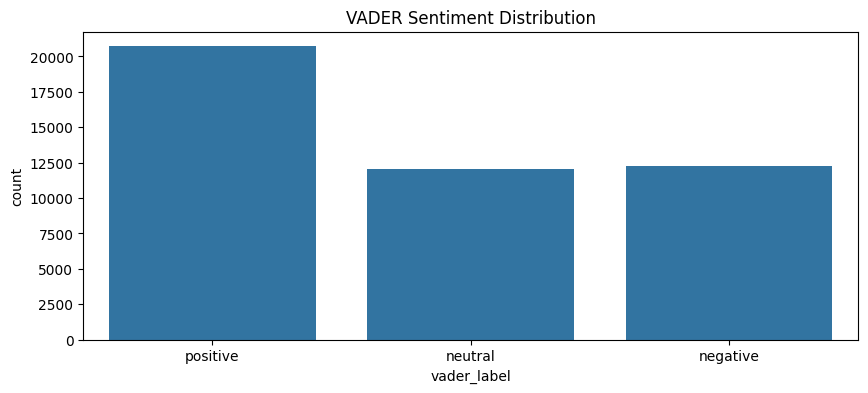

In [14]:
plt.figure(figsize=(10,4))
sns.countplot(data=df, x='vader_label', order=['positive','neutral','negative'])
plt.title("VADER Sentiment Distribution")
plt.show()

**Result**: It seems the comments are mostly positive accross all the videos

### Transformer Based Analysis

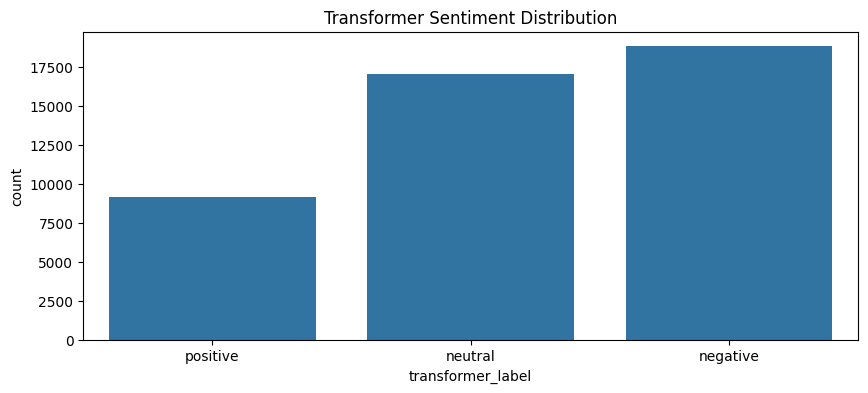

In [15]:
# Countplot for Transformer
plt.figure(figsize=(10,4))
sns.countplot(data=df, x='transformer_label', order=['positive','neutral','negative'])
plt.title("Transformer Sentiment Distribution")
plt.show()

**Result**: It seems people have negative sentiment towards the new series GPU launch.

Upon manual inspection of the comments, the transformer-based model seems to perform much better since people were actually not positive about the RTX 50-series launch and were skeptical about the claims made by NVIDIA during their launch.

It will be more sensible to evaluate the sentiment of a complete conversation, that is, taking into account, the replies to each comment. We will thread the replies to the parent comment. This way we will be able to evaluate the sentiment of a whole conversation.

## Thread-based Sentiment Analysis

In [5]:
df['comment_id'] = df.index.astype(str)

# Map comment_id to reply_to
reply_map = dict(zip(df['comment_id'], df['reply_to']))

def find_root_comment_id(comment_id):
    """
    Recursively find the root comment for a given comment_id
    """
    current = comment_id
    while pd.notna(reply_map.get(current)):
        current = reply_map[current]
    return current

# Apply mapping
df['thread_id'] = df['comment_id'].apply(find_root_comment_id)

In [11]:
thread_stats = (
    df.groupby('thread_id')
      .agg(
          total_comments=('comment_id', 'count'),
          avg_sentiment=('transformer_score', 'mean'),
          pos_pct=('transformer_score', lambda x: (x > 0).mean() * 100),
          neg_pct=('transformer_score', lambda x: (x < 0).mean() * 100),
          neu_pct=('transformer_score', lambda x: (x == 0).mean() * 100),
          top_authors=('author', lambda x: list(pd.Series(x).value_counts().head(3).index))
      )
      .reset_index()
)

# Sort threads by engagement
thread_stats = thread_stats.sort_values(by='total_comments', ascending=False)

In [38]:
root_comments = df[['comment_id', 'comment']].rename(columns={'comment_id': 'thread_id', 'comment': 'root_comment'})
thread_stats = thread_stats.merge(root_comments, on='thread_id', how='left')

In [40]:
thread_stats.head(10)

,thread_id,total_comments,avg_sentiment,pos_pct,neg_pct,neu_pct,top_authors,root_comment
0,@GamersNexus,30,0.726271,100.0,0.0,0.0,"[@robertlawrence9000, @Chazie_, @harryshuman9637]",NaN
1,@LinusTechTips,20,0.650661,100.0,0.0,0.0,"[@FriynMusic, @Sweaty-gr4nq, @narfsc2657]",NaN
2,@musawerbelfamyja6955,15,0.684138,100.0,0.0,0.0,"[@fujinshu, @Lightwish4K, @BugattiBoy01]",NaN
3,@AshtonCoolman,12,0.763116,100.0,0.0,0.0,"[@redracoon1322, @ytv6770, @ogpirons]",NaN
4,@Mr11ESSE111,11,0.720225,100.0,0.0,0.0,"[@Mr11ESSE111, @tilapiadave3234, @Teilerderden]",NaN
5,@MrBeetsGaming,11,0.722150,100.0,0.0,0.0,"[@MrBeetsGaming, @theScotsman87, @RiderOfKarma]",NaN
6,@MuahMan,11,0.790685,100.0,0.0,0.0,"[@AlphariousOmegon-d5d, @lucduguay11, @xXKissk...",NaN
7,@tomtomkowski7653,10,0.719804,100.0,0.0,0.0,"[@harmless6250, @Ilestun, @transcendtient]",NaN
8,@adlibconstitution1609,10,0.804504,100.0,0.0,0.0,"[@BonusCrook, @MRDaved, @deathstare0]",NaN
9,@techyescity,10,0.695008,100.0,0.0,0.0,"[@FreightTrain22, @asdflolasdf, @peterwstacey]",NaN


In [44]:
thread_stats.tail(10)

,thread_id,total_comments,avg_sentiment,pos_pct,neg_pct,neu_pct,top_authors,root_comment
40693,11572,1,0.833375,100.0,0.0,0.0,[@defencebangladesh4068],just wait 24 hours...
40694,11573,1,0.917908,100.0,0.0,0.0,[@Livingroomgamer],what does the 4070 super ti cost? and what doe...
40695,@zyaniph4798,1,0.905956,100.0,0.0,0.0,[@wolffwolfie3166],NaN
40696,@zzmadd,1,0.893846,100.0,0.0,0.0,[@cameron_bosch],NaN
40697,@انا_ابراهيم_البناوي,1,0.566622,100.0,0.0,0.0,[@arenzricodexd4409],NaN
40698,11574,1,0.866151,100.0,0.0,0.0,[@MemelordSupreme],its a real shame. ive been team green since th...
40699,@怪啊啊,1,0.560912,100.0,0.0,0.0,[@denberz711],NaN
40700,11575,1,0.683096,100.0,0.0,0.0,[@artemis2314],the 4070 super duper
40701,@關昌基,1,0.671034,100.0,0.0,0.0,[@daunted232],NaN
40702,10008,1,0.786086,100.0,0.0,0.0,[@rickross7719],"i saw the nvidia email this morning, and thoug..."


In [74]:
#thread_stats.to_csv('thread_stats.csv', index=False)

In [7]:
thread_stats = pd.read_csv('thread_stats.csv')

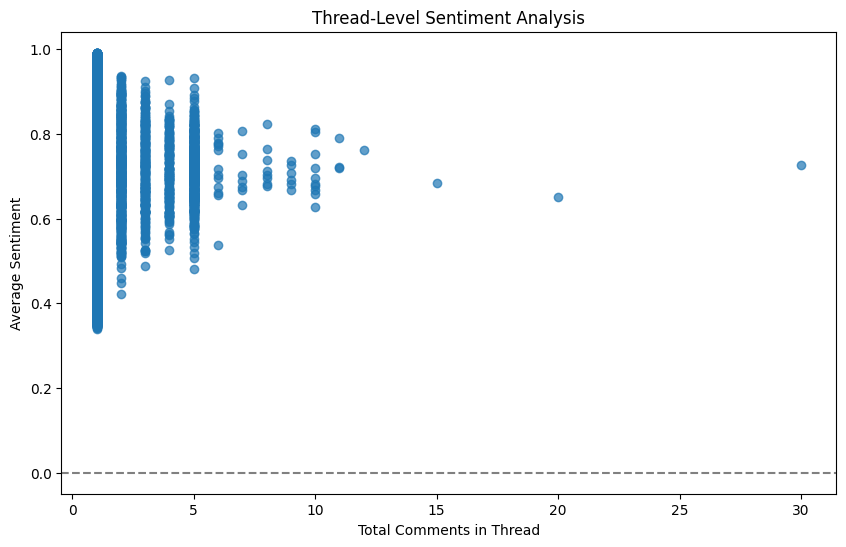

In [9]:
plt.figure(figsize=(10,6))
plt.scatter(thread_stats['total_comments'], thread_stats['avg_sentiment'], alpha=0.7)
plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Total Comments in Thread')
plt.ylabel('Average Sentiment')
plt.title('Thread-Level Sentiment Analysis')
plt.show()

In [9]:
df = df.merge(thread_stats[['thread_id', 'avg_sentiment', 'total_comments']], 
              on='thread_id', 
              how='left')

In [11]:
most_positive = thread_stats.sort_values(by="avg_sentiment", ascending=False).head(10)
most_negative = thread_stats.sort_values(by="avg_sentiment", ascending=True).head(10)
most_discussed = thread_stats.sort_values(by="total_comments", ascending=False).head(10)

### Merge Representative Comments

In [17]:
representative_comments = (
    df.loc[df.groupby('thread_id')['likes'].idxmax(), ['thread_id', 'comment']]
    .rename(columns={'comment': 'top_comment'})
)

thread_stats_with_comments = thread_stats.merge(representative_comments, on='thread_id', how='left')

### Visualize Top 20 Most Discussed Threads

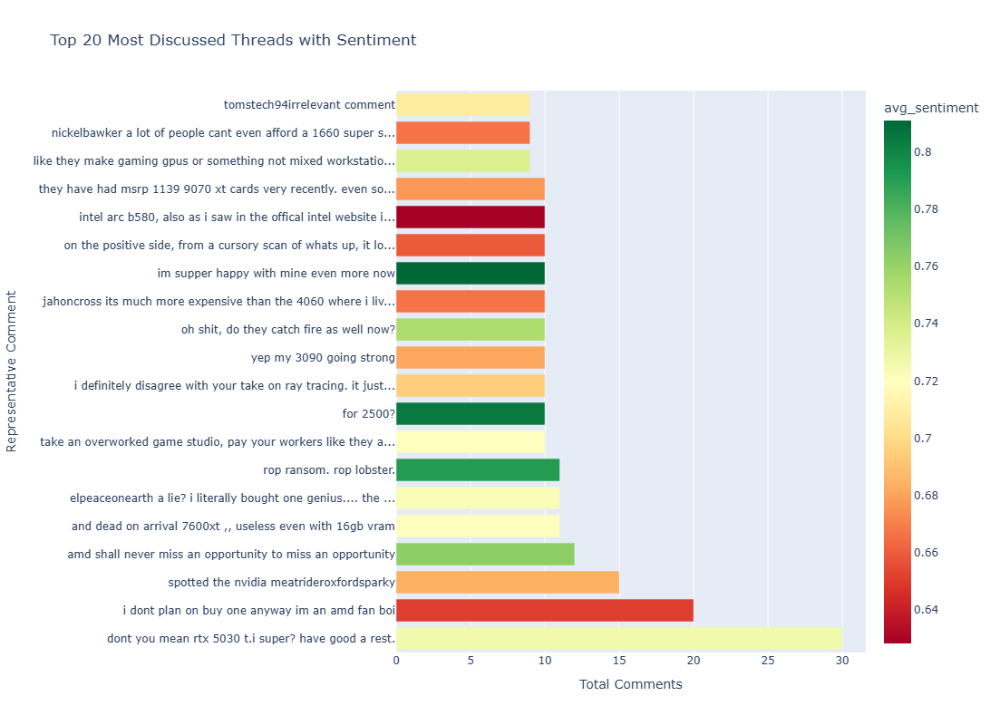

In [19]:
# Prepare data for plot
thread_stats_with_comments['short_comment'] = (
    thread_stats_with_comments['top_comment']
    .fillna("")
    .astype(str)
    .apply(lambda x: x if len(x) <= 60 else x[:60] + '...')
)

# Create interactive bar chart
fig = px.bar(
    thread_stats_with_comments.sort_values(by="total_comments", ascending=False).head(20),
    x="total_comments",
    y="short_comment",
    color="avg_sentiment",
    color_continuous_scale="RdYlGn",
    hover_data={
        "top_comment": True,
        "avg_sentiment": ':.2f',
        "total_comments": True
    },
    title="Top 20 Most Discussed Threads with Sentiment",
    orientation="h"
)

fig.update_layout(
    yaxis_title="Representative Comment",
    xaxis_title="Total Comments",
    height=800
)

fig.show()

Let's visualize the most frequent words for each of the sentiments:

### Visualization through Wordcloud

#### Positive Sentiment

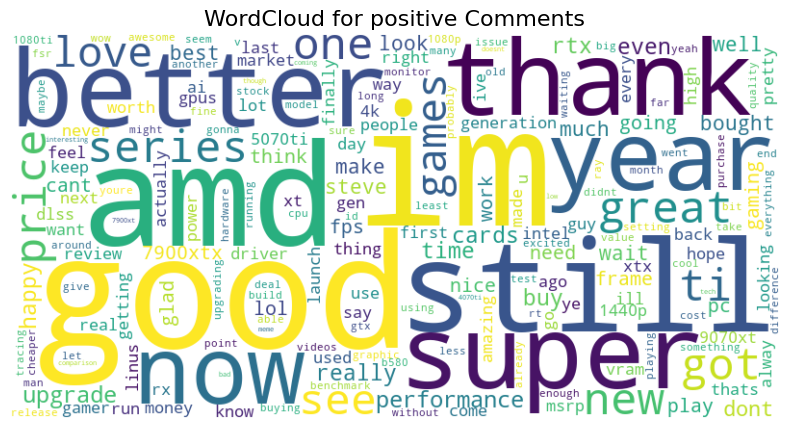

In [11]:
generate_wordcloud(df, "positive")

#### Negative Sentiment

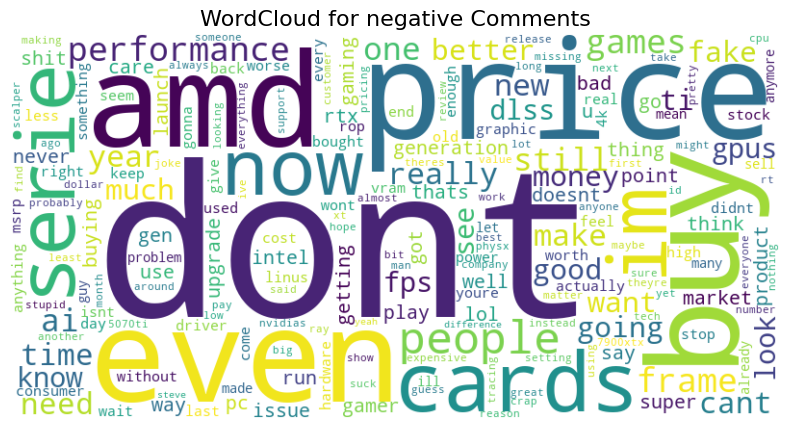

In [13]:
generate_wordcloud(df, "negative")

#### Neutral Sentiment

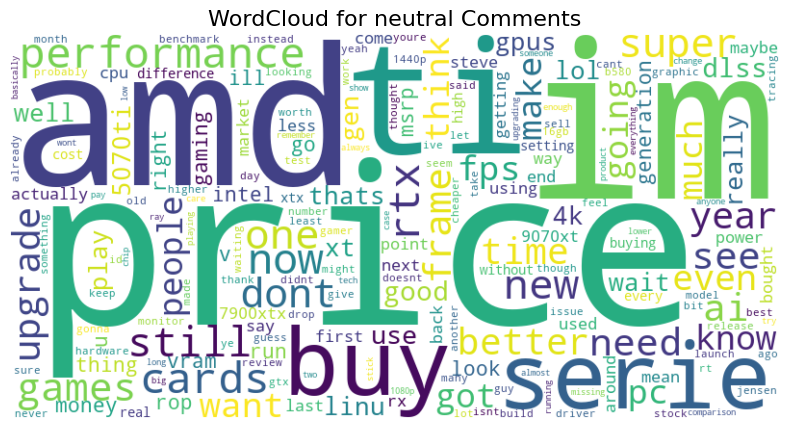

In [15]:
generate_wordcloud(df, "neutral")

# Sarcasm Analysis

We'll use a pre-trained **Transformer-based** model, to look for texts that suggest sarcasm.

In [13]:
sarcasm_model = "mrm8488/t5-base-finetuned-sarcasm-twitter"
tokenizer = AutoTokenizer.from_pretrained(sarcasm_model)
model = AutoModelForSeq2SeqLM.from_pretrained(sarcasm_model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

def hf_detect_sarcasm(texts, batch_size=32, max_length=180):
    predictions = []

    for i in tqdm(range(0, len(texts), batch_size), desc="Predicting sarcasm"):
        batch = texts[i:i+batch_size]
        
        inputs = tokenizer(
            batch,
            return_tensors="pt",
            padding=True,
            truncation=True,
            max_length=max_length
        ).to(device)

        with torch.no_grad():
            # mixed precision for speed
            with torch.cuda.amp.autocast():
                outputs = model.generate(**inputs, max_length=max_length)

        decoded = [tokenizer.decode(o, skip_special_tokens=True) for o in outputs]
        predictions.extend(decoded)

    return predictions

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


In [17]:
texts = df["comment"].fillna("").astype(str).tolist()
sarcasm_preds = hf_detect_sarcasm(texts, batch_size=96)

# Save results back to df
df["is_sarcastic"] = sarcasm_preds

C:\Users\subhr\AppData\Local\Temp\ipykernel_6380\783270229.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Predicting sarcasm: 100%|██████████| 470/470 [2:42:12<00:00, 20.71s/it]  


In [5]:
#df.to_csv('youtube_comments_working-2.csv', index = False)

In [3]:
df = pd.read_csv('youtube_comments_working-2.csv')
df.head()

,video_id,author,comment,likes,published_at,reply_to,month,year,day_of_week,hour,vader_score,vader_label,transformer_label,transformer_score,comment_id,thread_id,avg_sentiment,total_comments,is_sarcastic
0,YBJEiWDPyGs,@kecktus2017,sponsor daniel,0,2025-08-11 10:15:37+00:00,NaN,8,2025,Monday,10,0.0000,neutral,neutral,0.655514,0,0,0.655514,1,derisonel risonel risonel risonel risonel riso...
1,YBJEiWDPyGs,@Par_F2980,shut up,0,2025-08-07 12:17:00+00:00,NaN,8,2025,Thursday,12,0.0000,neutral,neutral,0.456854,1,1,0.456854,1,shut up
2,YBJEiWDPyGs,@stirfe887,955 1999 for 5090 but it coast 500 in germany ...,0,2025-07-30 20:19:53+00:00,NaN,7,2025,Wednesday,20,0.8047,positive,positive,0.921563,2,2,0.921563,1,normal
3,YBJEiWDPyGs,@razzor707,that was a sick joke ngl,0,2025-07-30 00:18:59+00:00,NaN,7,2025,Wednesday,0,-0.2732,negative,negative,0.887245,3,3,0.887245,1,derisonrisonrisone derisonrison derisonrison d...
4,YBJEiWDPyGs,@CommentSectionOffender,"considering 5070 super might have 18gb vram, t...",1,2025-07-29 09:32:14+00:00,NaN,7,2025,Tuesday,9,0.8750,positive,positive,0.914432,4,4,0.914432,1,normal


In [5]:
df["is_sarcastic"] = df["is_sarcastic"].apply(sarcasm_to_binary)

In [7]:
df["is_sarcastic"].value_counts()

is_sarcastic
0    22699
1    22341
Name: count, dtype: int64

It looks like, there almost equal number of sarcastic and non-sarcastic comments across the videos.

In [12]:
#df.to_csv('youtube_comments_working-3.csv', index=False)

# Emotion Classification

We will use, ROBERTa based, '*SamLowe/roberta-base-go_emotions*' pre-trained model, for classifying the emotions of each comment

In [3]:
df = pd.read_csv('youtube_comments_working-3.csv')

df["emotions"] = classify_emotions(df["comment"].fillna("").tolist())
df["emotions"].value_counts()

Device set to use cuda:0
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset  1.43it/s]
100%|████████████████████████████████████████████████████████████████████████████████| 704/704 [15:47<00:00,  1.35s/it]


emotions
[neutral, approval, realization, annoyance, disapproval]       849
[neutral, approval, annoyance, realization, disapproval]       836
[neutral, approval, annoyance, realization, admiration]        472
[neutral, approval, realization, annoyance, admiration]        444
[neutral, approval, disapproval, realization, annoyance]       407
                                                              ... 
[neutral, optimism, excitement, surprise, desire]                1
[neutral, amusement, annoyance, curiosity, desire]               1
[annoyance, realization, neutral, surprise, disappointment]      1
[neutral, surprise, curiosity, confusion, excitement]            1
[gratitude, joy, relief, optimism, neutral]                      1
Name: count, Length: 10345, dtype: int64

In [9]:
#df.to_csv('youtube_comments_working-4.csv', index=False)

In [2]:
df = pd.read_csv('youtube_comments_working-4.csv')
df.head()

,video_id,author,comment,likes,published_at,reply_to,month,year,day_of_week,hour,vader_score,vader_label,transformer_label,transformer_score,comment_id,thread_id,avg_sentiment,total_comments,is_sarcastic,emotions
0,YBJEiWDPyGs,@kecktus2017,sponsor daniel,0,2025-08-11 10:15:37+00:00,NaN,8,2025,Monday,10,0.0000,neutral,neutral,0.655514,0,0,0.655514,1,1,"['neutral', 'approval', 'annoyance', 'realizat..."
1,YBJEiWDPyGs,@Par_F2980,shut up,0,2025-08-07 12:17:00+00:00,NaN,8,2025,Thursday,12,0.0000,neutral,neutral,0.456854,1,1,0.456854,1,1,"['anger', 'annoyance', 'neutral', 'disapproval..."
2,YBJEiWDPyGs,@stirfe887,955 1999 for 5090 but it coast 500 in germany ...,0,2025-07-30 20:19:53+00:00,NaN,7,2025,Wednesday,20,0.8047,positive,positive,0.921563,2,2,0.921563,1,0,"['admiration', 'neutral', 'approval', 'excitem..."
3,YBJEiWDPyGs,@razzor707,that was a sick joke ngl,0,2025-07-30 00:18:59+00:00,NaN,7,2025,Wednesday,0,-0.2732,negative,negative,0.887245,3,3,0.887245,1,1,"['amusement', 'neutral', 'joy', 'annoyance', '..."
4,YBJEiWDPyGs,@CommentSectionOffender,"considering 5070 super might have 18gb vram, t...",1,2025-07-29 09:32:14+00:00,NaN,7,2025,Tuesday,9,0.8750,positive,positive,0.914432,4,4,0.914432,1,0,"['admiration', 'approval', 'optimism', 'neutra..."


## Visualization of some emotions

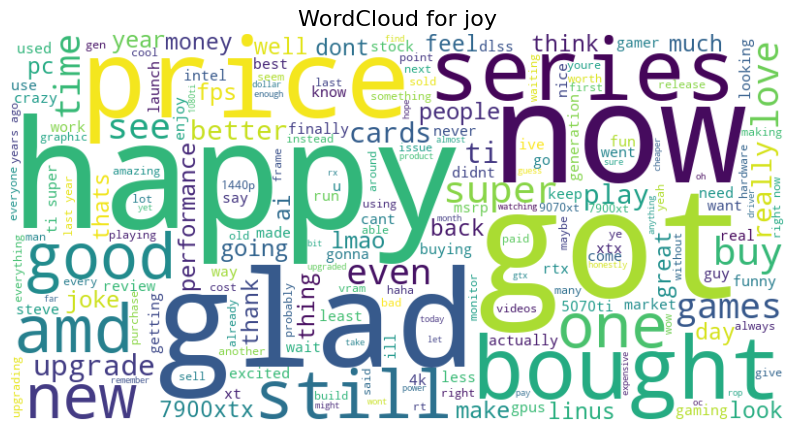

In [5]:
visualize_emotions(df, top_emotion="joy")

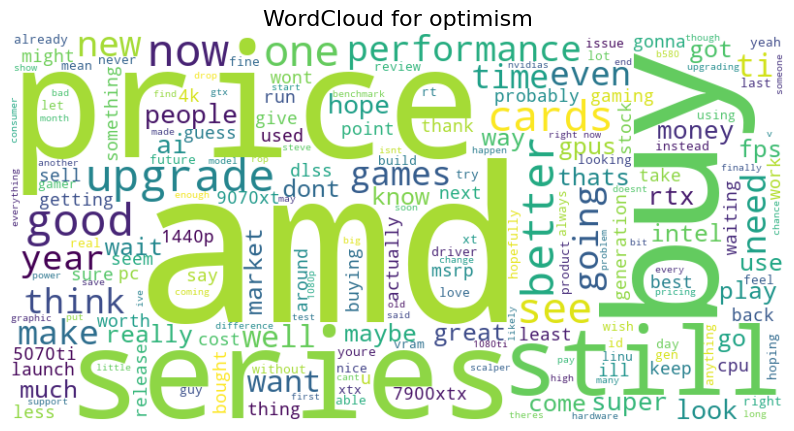

In [7]:
visualize_emotions(df, top_emotion="optimism")

# Topic Modeling

In [4]:
df, topic_model, topic_info = topic_modeling(df, text_col="comment")

In [5]:
topic_info.head()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,19070,-1_games_performance_cards_card,"[games, performance, cards, card, fps, nvidia,...",[so its a 4070 super 1 fps. im glad i got the ...
1,0,768,0_gpu_gpus_worst_new,"[gpu, gpus, worst, new, buying, market, car, g...","[which gpu should i buy?, give me gpu, can i h..."
2,1,505,1_4090_5090_4080_5080,"[4090, 5090, 4080, 5080, nvidia, 4090s, 5060, ...","[wait i just realized, could the 50x more fram..."
3,2,404,2_linus_tips_held_hes,"[linus, tips, held, hes, linuss, gunpoint, lin...","[linus, another linus w., linus, linus]"
4,3,387,3_rtx_6090_5050_5060,"[rtx, 6090, 5050, 5060, rtx50, 5030, 5070, rtx...","[rtx 5070, what is that?, rtx 5070, rtx 5]"


In [10]:
#topic_info.to_csv('topic_info', index=False)

## Topic Modeling Visualization

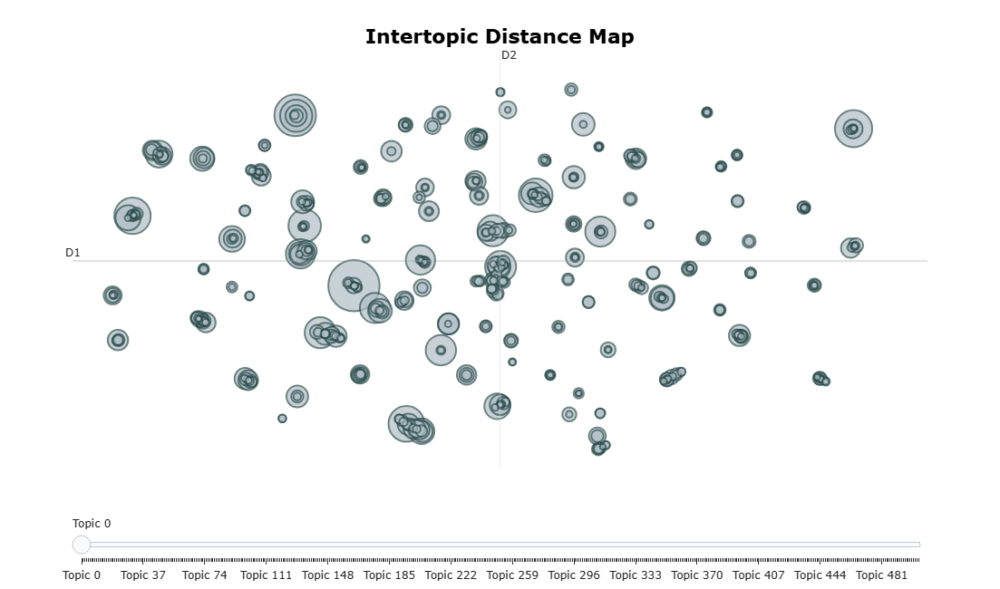

In [6]:
topic_model.visualize_topics()

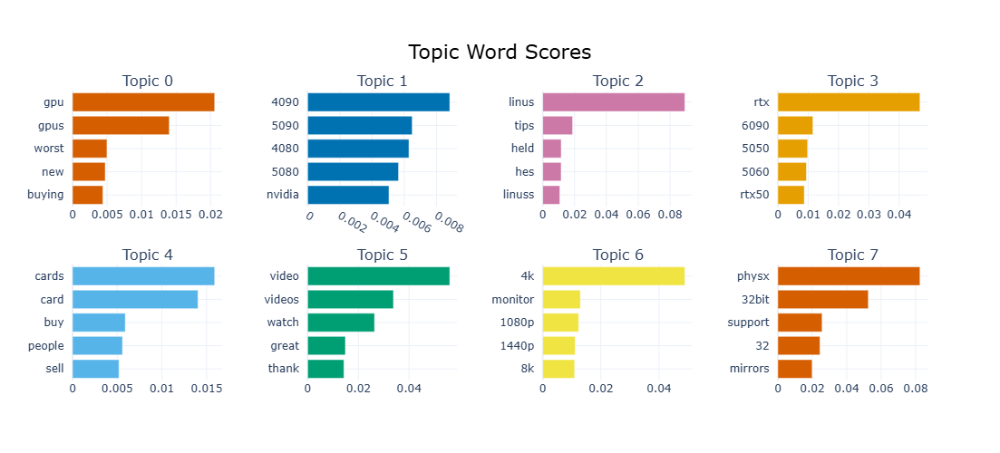

In [7]:
topic_model.visualize_barchart()

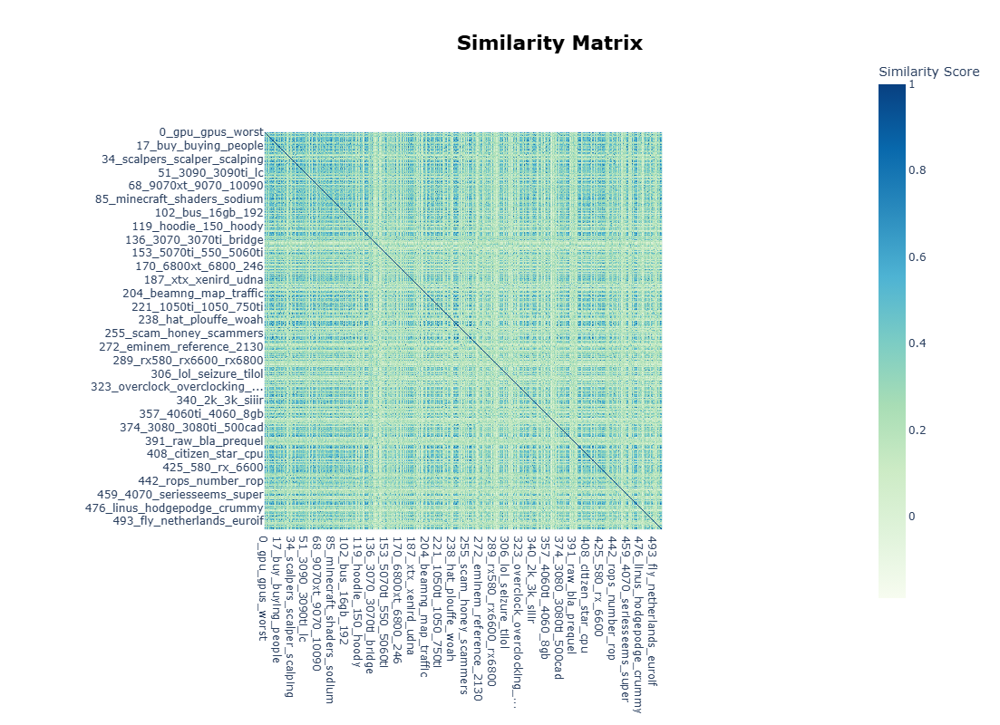

In [8]:
topic_model.visualize_heatmap()

# Keyword Extraction

We'll try to extract keywords based on each type of sentiments, and then visualize them using a Wordcloud for each.

In [3]:
sentiment_keywords = extract_keywords_per_sentiment(df, text_col="comment", sentiment_col="transformer_label")

for sentiment, keywords in sentiment_keywords.items():
    print(f"\nSentiment: {sentiment}")
    for kw, score in keywords:
        print(f"  {kw} ({score:.4f})")


Sentiment: neutral
  performancewise 5070ti (0.6486)
  faster 5070ti (0.6412)
  performance 5070ti (0.6410)
  5070ti performance (0.6376)
  50xx performance (0.6343)
  5070 performance (0.6336)
  5070ti vs (0.6298)
  performance 5070 (0.6182)
  5080 graphics (0.6160)
  5070ti better (0.6146)

Sentiment: positive
  5070 performance (0.6620)
  compared 5070ti (0.6587)
  5070ti thinking (0.6544)
  5070 underwhelming (0.6539)
  5070 compared (0.6533)
  vs 5070ti (0.6511)
  performance 5070ti (0.6462)
  5070 vs (0.6457)
  compared 5070 (0.6456)
  considering 5070 (0.6425)

Sentiment: negative
  rtx50 gpu (0.5668)
  5000 gpus (0.5594)
  nvidia rethink (0.5584)
  rtx 5000series (0.5528)
  5000 nvidia (0.5503)
  absurdity nvidia (0.5476)
  nvidia rtx50 (0.5470)
  rtx gpus (0.5460)
  rtx 5000 (0.5457)
  scamvidia soon (0.5430)


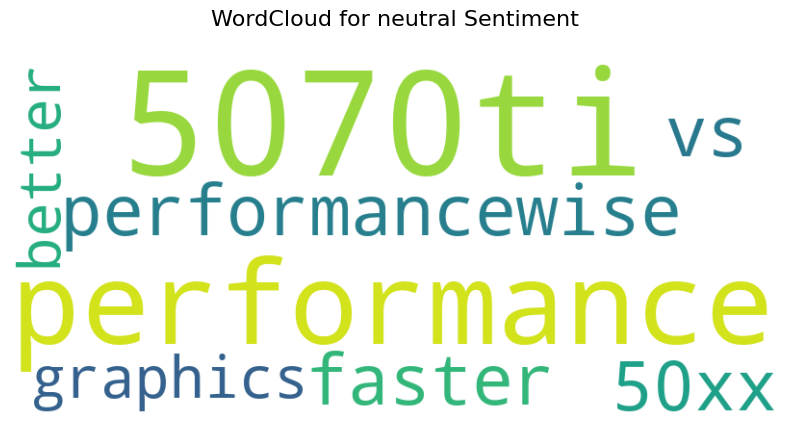

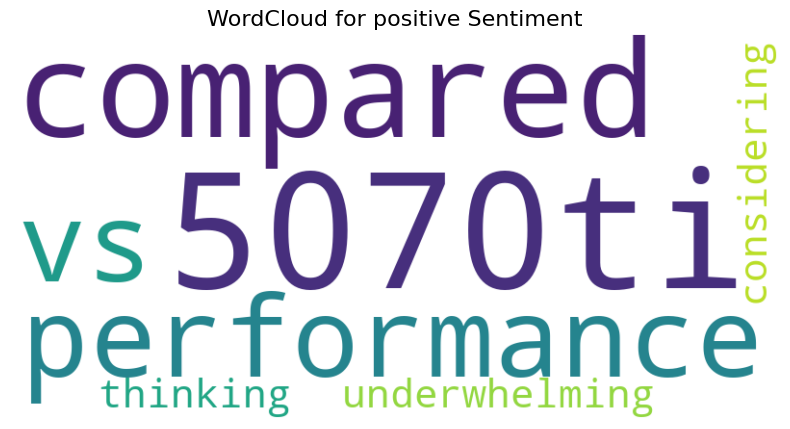

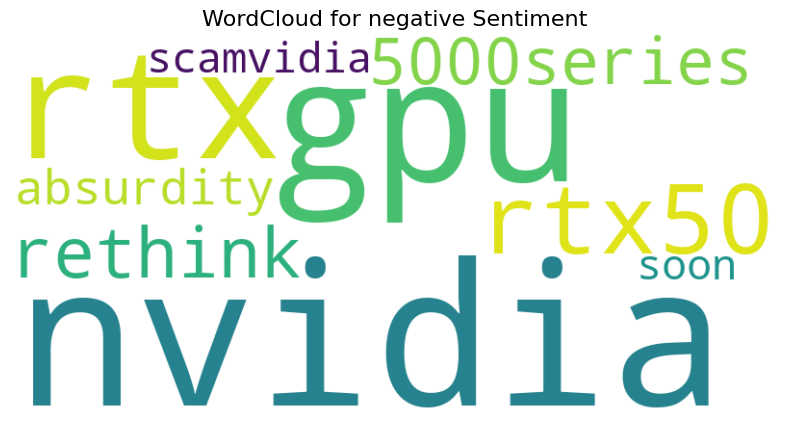

In [5]:
for sentiment, keywords in sentiment_keywords.items():
        text = " ".join([kw for kw, _ in keywords])
        wc = WordCloud(width=800, height=400, background_color="white").generate(text)
        
        plt.figure(figsize=(10,5))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"WordCloud for {sentiment} Sentiment", fontsize=16)
        plt.show()